# Airbnb data analysis project for the area of Athens from Feb-Apr 2018

# Part 1: Data exploration

### *train.csv* file contains columns from all *listings.csv* files inside the *data* directory.
### Note: to read our train file, we need to execute the code inside *generate_train.ipynb* once, which also handles the cleaning of our data.

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

train_df = pd.read_csv("train.csv")
train_df.head()

,id,name,description,transit,host_since,host_response_rate,host_has_profile_pic,host_identity_verified,neighbourhood,city,...,price,minimum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,instant_bookable,cancellation_policy,month
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",Athens Furnished Apartment No6 is 3-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,73.0,1,222,19,2011-05-20,2019-04-08,97.0,t,strict_14_with_grace_period,april
1,10988,"75m2, 2-br, metro, wi-fi, cable TV",Athens Furnished Apartment No4 is 2-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,82.0,1,0,31,2012-10-21,2017-11-23,92.0,t,strict_14_with_grace_period,april
2,10990,"50m2, Metro, WI-FI, cableTV, more",Athens Furnished Apartment No3 is 1-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,49.0,1,234,29,2012-09-06,2019-03-03,97.0,t,strict_14_with_grace_period,april
3,10993,"Studio, metro, cable tv, wi-fi, etc",The Studio is an -excellent located -close t...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,38.0,1,226,45,2012-09-24,2019-04-04,96.0,t,strict_14_with_grace_period,april
4,10995,"47m2, close to metro,cable TV,wi-fi",AQA No2 is 1-bedroom apartment (47m2) -excell...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,49.0,2,249,17,2010-07-08,2019-04-04,95.0,t,strict_14_with_grace_period,april


## Most common room type

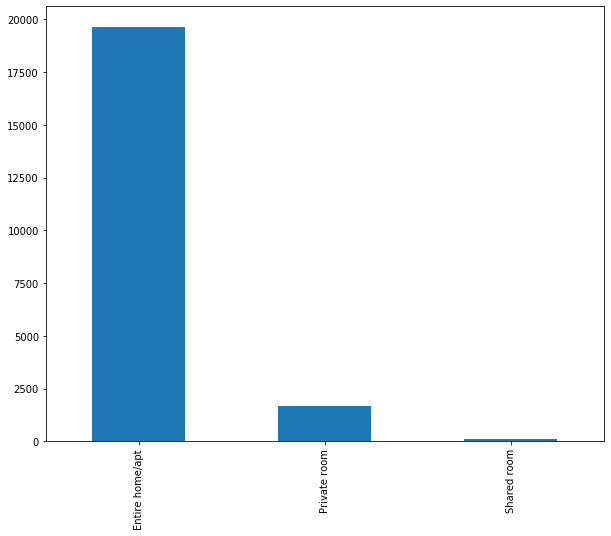

In [2]:
train_df['room_type'].value_counts().plot.bar(figsize=(10,8))

## Mean value of prices over the months of February, March and April 2018

Read February's calendar.csv

In [4]:
feb_cal = pd.read_csv(os.getcwd()+'/data/february/calendar.csv', usecols=['listing_id','date','price'])
feb_cal = feb_cal.dropna()

Remove the '$' sign from the *price* column and convert the valyes to floats.

In [5]:
""" Replace dolar sign on prices and convert them to float type. """
feb_cal['price'] = [x.replace('$', '') for x in feb_cal['price']]
feb_cal.price = [x.replace(',', '') for x in feb_cal.price]
feb_cal['price'] = pd.to_numeric(feb_cal['price'])

Convert *date* column values to datetime.

In [6]:
feb_cal['date']= pd.to_datetime(feb_cal['date'])

Filter the dates accordingly.

In [7]:
start_date = pd.to_datetime('2019-2-8')
end_date = pd.to_datetime('2019-4-30')

filtered = feb_cal[(feb_cal['date'] >= start_date) & (feb_cal['date'] <= end_date)]

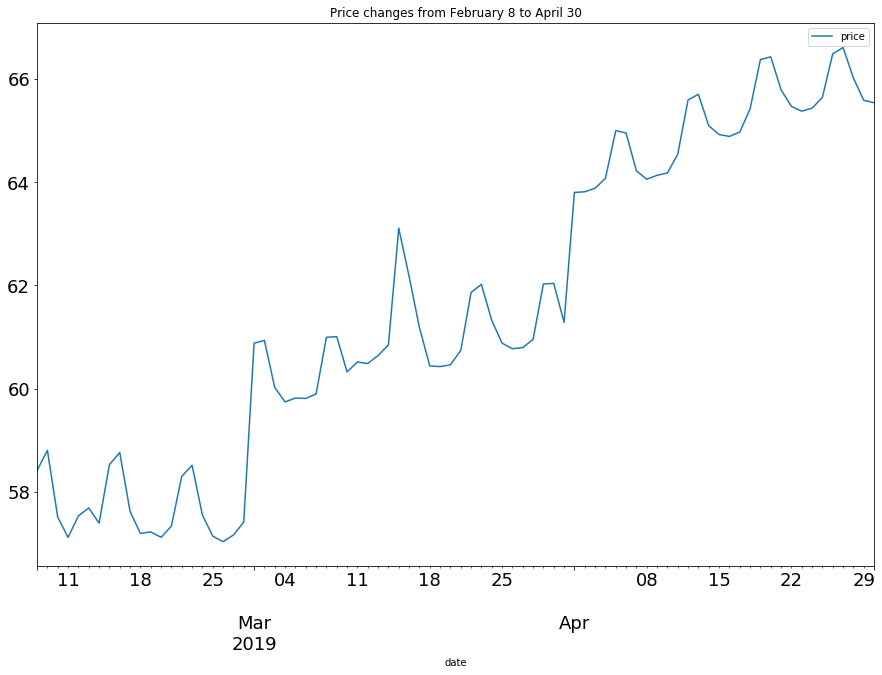

In [8]:
price_course = filtered.groupby("date").agg({"price" : np.mean})
price_course.plot(title = 'Price changes from February 8 to April 30',
                  figsize=(15,10),
                  fontsize=18)

## Five most rated neighbourhoods.


The five most reviewed neighbourhoods are:


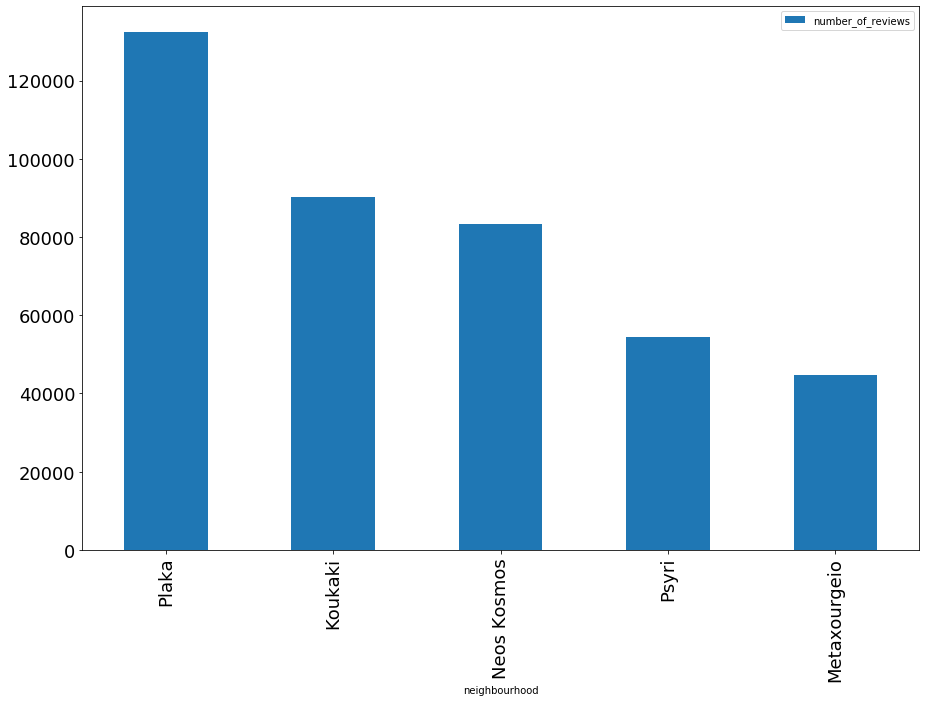

In [9]:
print("The five most reviewed neighbourhoods are:")
df = train_df.groupby("neighbourhood").agg({"number_of_reviews" : sum}).sort_values(by = "number_of_reviews", ascending = False)
df.head(5).plot.bar(figsize=(15,10),
                  fontsize=18)

## Neighbourhood with most listings.

In [9]:
print("The neighbourhood with the most estate logs is",train_df['neighbourhood'].value_counts().idxmax())

The neighbourhood with the most estate logs is Plaka


## Heatmap for the number of listings for every month and neighbourhood.

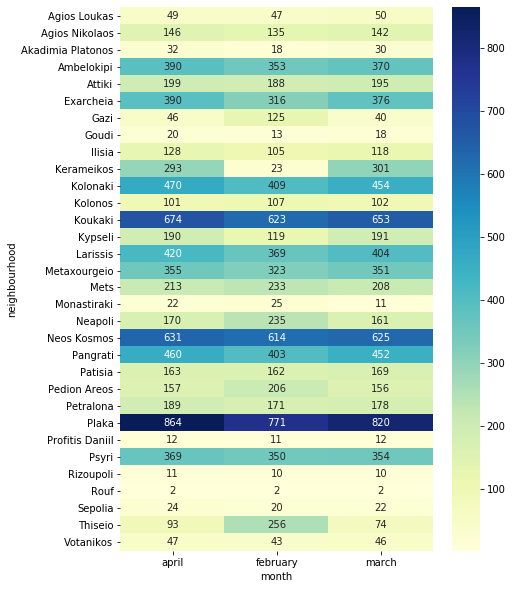

In [10]:
import seaborn as sns

dataset = train_df.groupby(["neighbourhood","month"]).size().to_frame(name='count').reset_index()
dataset = dataset.pivot(index='neighbourhood', columns='month', values='count')
plt.subplots(figsize=(7,10))
hmap = sns.heatmap(dataset, annot=True, fmt="g", cmap='YlGnBu')

## *Neighbourhood* column histogram

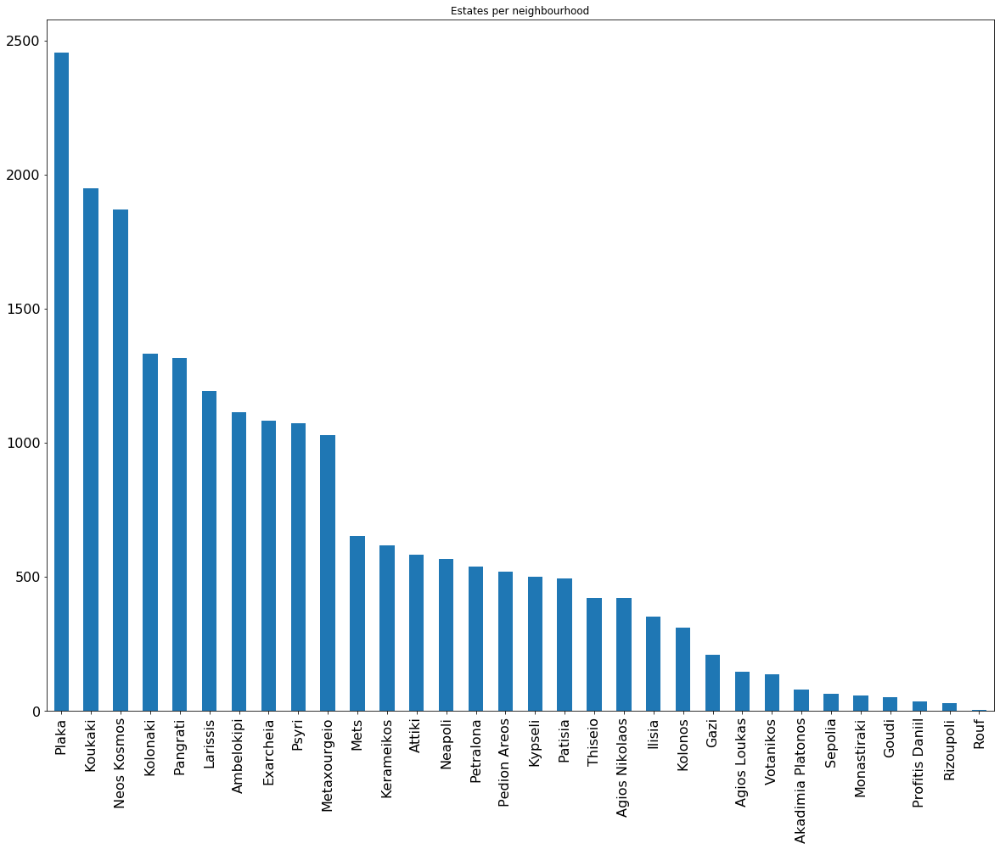

In [11]:
neigh_hgram = train_df.neighbourhood.value_counts()
neigh_hgram.plot.bar(title = 'Estates per neighbourhood',
                  figsize=(20,15),
                  fontsize=16)

## Heatmap of room types for every neighbourhood.

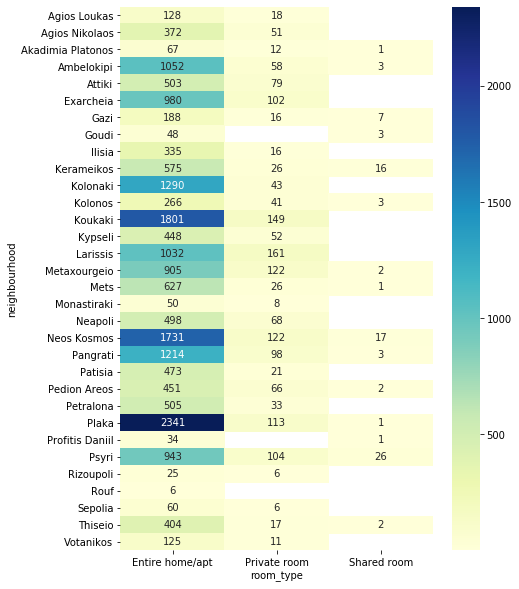

In [12]:
dataset = train_df.groupby(["neighbourhood","room_type"]).size().to_frame(name='count').reset_index()
dataset = dataset.pivot(index='neighbourhood', columns='room_type', values='count')
plt.subplots(figsize=(7,10))
hmap = sns.heatmap(dataset, annot=True, fmt="g", cmap='YlGnBu')

## Most expensive room type

In [12]:
print("Most expensive room type is:")
train_df[train_df['price'] == train_df['price'].max()].room_type.head(1)

Most expensive room type is:


13311    Entire home/apt
Name: room_type, dtype: object

## Cluster map of Athens in April

In [15]:
from folium import plugins

athens_in_april = folium.Map(location=[37.984338, 23.727009], zoom_start=13)

mac = plugins.MarkerCluster().add_to(athens_in_april)

april_df = train_df[train_df['month'] == 'april']

for i, v in april_df.iterrows():
    popup_info = """
                Location id: <b>%s</b><br>
                Room type: <b>%s</b><br>
                Bed_type: <b>%s</b><br>
                Neighbourhood: <b>%s</b><br>
                Price: <b>%s</b><br>
    """% (v["id"],v["room_type"],v["bed_type"],v["neighbourhood"],v["price"])
    
    if v['room_type'] == 'Entire home/apt':
        folium.CircleMarker(location = [v['latitude'], v['longitude']],
                            radius = 5,
                            tooltip = popup_info,
                            color = '#FFBA00',
                            fill_color = '#FFBA00',
                            fill = True).add_to(mac)
    elif v['room_type'] == 'Private room':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius = 5,
                            tooltip = popup_info,
                            color = '#087FBF',
                            fill_color = '#087FBF',
                            fill = True).add_to(mac)
    elif v['room_type'] == 'Shared room':
        folium.CircleMarker(location = [v['latitude'], v['longitude']],
                            radius = 5,
                            tooltip = popup_info,
                            color = '#FF0700',
                            fill_color = '#FF0700',
                            fill = True).add_to(mac)
athens_in_april

## Several word clouds

In [31]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
from os import path

mask_dir = os.path.join(os.getcwd(), "wordcloud_masks")

### *Neighbourhood* word cloud

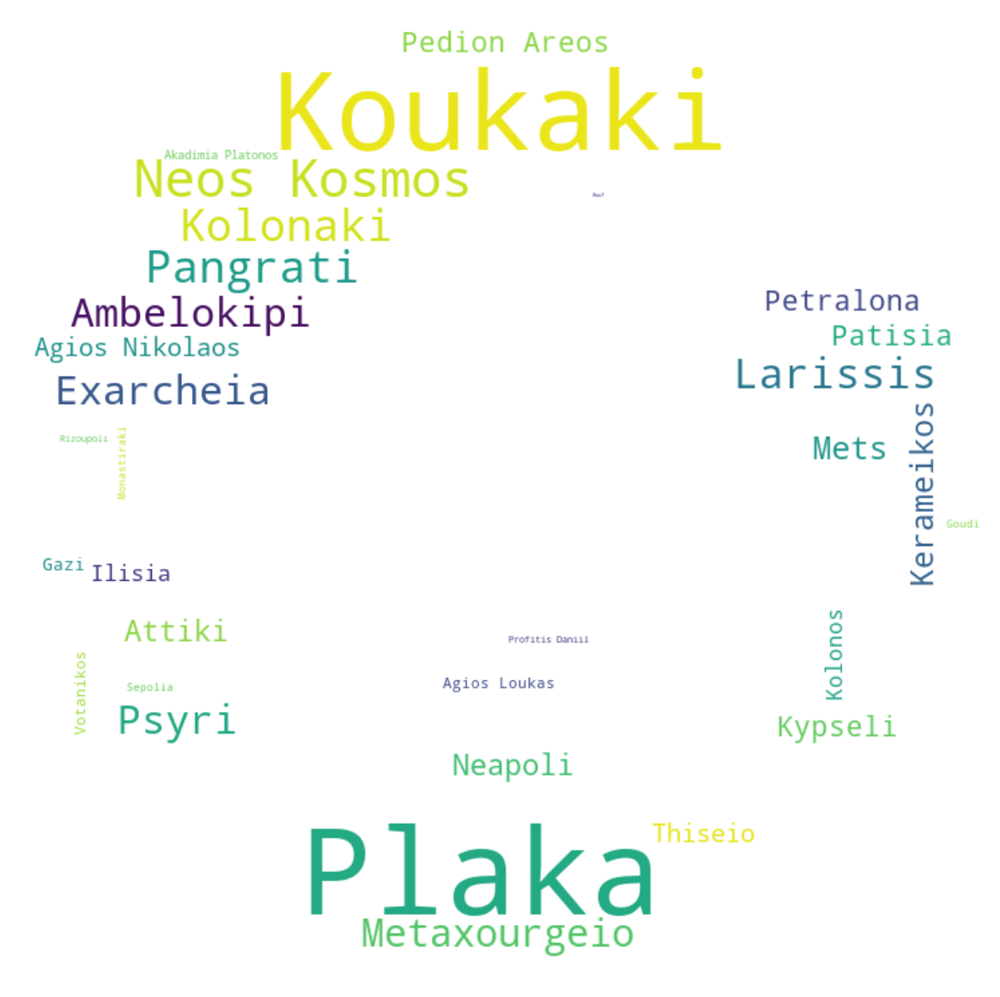

In [20]:
neighbourhood_mask = np.array(Image.open(path.join(mask_dir, "neighbourhood.jpg")))

neighbourhood_col = train_df[train_df['neighbourhood'].notna()]['neighbourhood']
neighbourhoods_freq = dict(tuple([tuple(x) for x in neighbourhood_col.value_counts().reset_index().values]))

wordcloud = WordCloud(width = 1920,
                      height = 1080,
                      mask = neighbourhood_mask,
                      background_color = 'white').generate_from_frequencies(neighbourhoods_freq)

plt.figure(figsize=(20,10), dpi = 150)
plt.axis("off")
plt.imshow(wordcloud, interpolation='bilinear')

### *Transit* word cloud

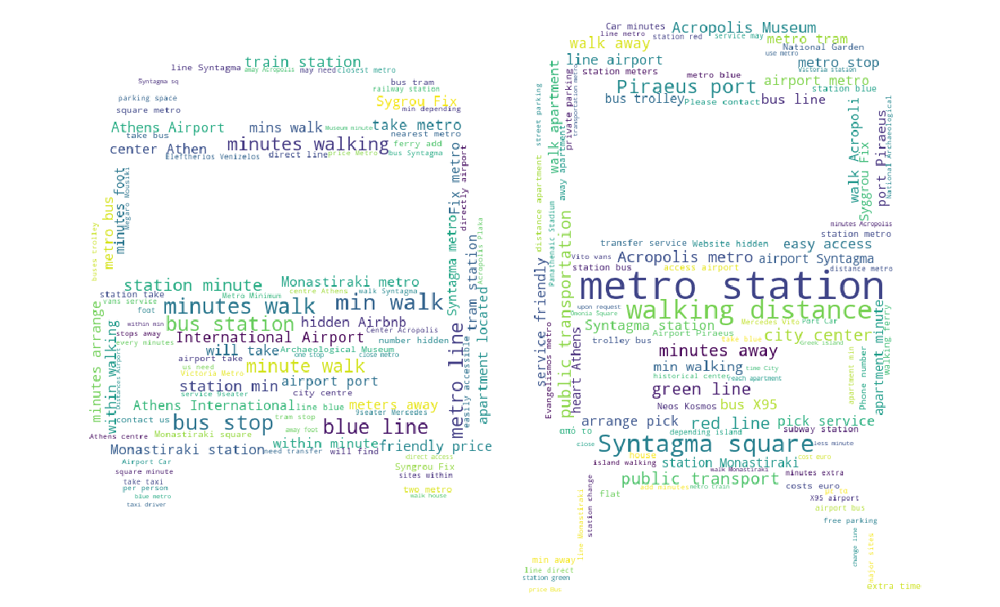

In [58]:
transport_mask = np.array(Image.open(path.join(mask_dir, "public-transport.png"))) # Open the public-transport.png image.

neighbourhood_df = train_df[train_df['transit'].notna()]['transit']
neigh_freq = tuple([tuple(x) for x in neighbourhood_df.value_counts().reset_index().values])

neighbourhood_wc = WordCloud(width = 1920,
                      height = 1080,
                       mask=transport_mask,
                       background_color='white',
                       colormap = 'viridis').generate(' '.join(neighbourhood_df))
plt.figure(figsize=(20,10), dpi=96)
plt.axis("off")
plt.imshow(neighbourhood_wc)

### *Description* word cloud

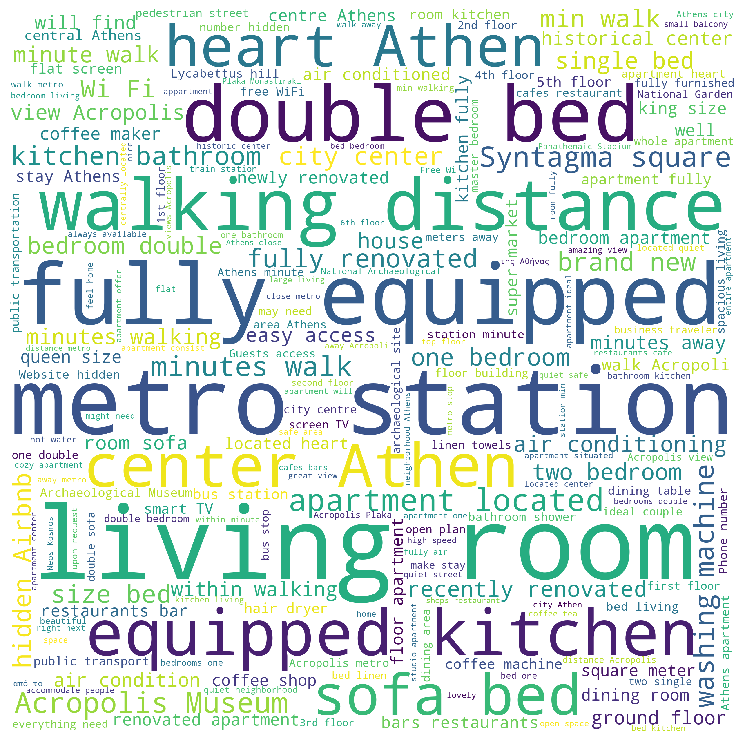

In [59]:
# airbnb_mask = np.array(Image.open(path.join(mask_dir, "airbnb.png")))
# image_colors = ImageColorGenerator(description_mask)

description_col = train_df[train_df['description'].notna()]['description']

desc_wc = WordCloud(width = 1920,
                    height = 1080,
                    mask = airbnb_mask,
                    background_color = 'white').generate(' '.join(description_col))

plt.figure(figsize=[20,10], dpi=96)

# plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")

plt.axis("off")
plt.imshow(desc_wc)

### Last_reviews word cloud

From our *train* keep the *id* and *last_review* columns.

In [ ]:
df = train_df[train_df['month']=='february']
df = df[['id','last_review']]

Open February's *review.csv* data file and keep the columns specified below.

In [60]:
reviews_df = pd.read_csv(os.getcwd()+"/data/february/reviews.csv")
reviews_df = reviews_df[reviews_df['comments'].notnull()]
reviews_df = reviews_df[['listing_id','date','comments']]

Merge each listing with their last review from *reviews.csv*.

In [61]:
df = df.merge(reviews_df,left_on=['id','last_review'],right_on=['listing_id','date'])

Get the *comments* column.

In [62]:
reviews = df['comments']

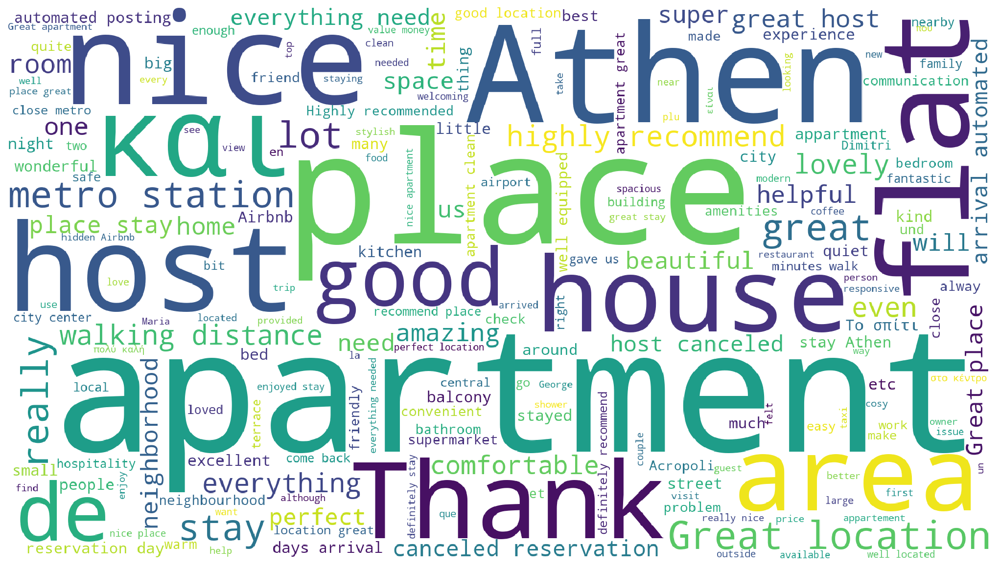

In [63]:
wordcloud4 = WordCloud(width=1920, height=1080, background_color='white').generate(' '.join(reviews))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud4)
plt.axis("off")
plt.show()

## Total listings with the highest rating, with their price varying from 30-50 Euros.

In [65]:
price_filtered_df = train_df.loc[(train_df['price'] >= 30) &
                                 (train_df['price'] <= 50) &
                                 (train_df['review_scores_rating'] == 100)]
print("Total estates with perfect rating:",price_filtered_df.price.count())

Total estates with perfect rating: 2636


## Most expensive listing at the neighbourhood with the least listings.

In [64]:
min = train_df['neighbourhood'].value_counts().idxmin()
df = train_df[['neighbourhood','price']]
df.loc[(df.neighbourhood == min)].sort_values(by = 'price', ascending = False).head(1)

,neighbourhood,price
13310,Rouf,55.0


# Part 2: Recommendation System

In [67]:
rec_df = train_df[['id','name','description']]
rec_df = rec_df.where(pd.notnull(rec_df), "")
rec_df = rec_df.drop_duplicates("id").reset_index(drop=True)

Convert the values of *description* to lower case.

In [68]:
rec_df['description'] = rec_df['description'].str.lower()

## *Description* word clouds without stopwords

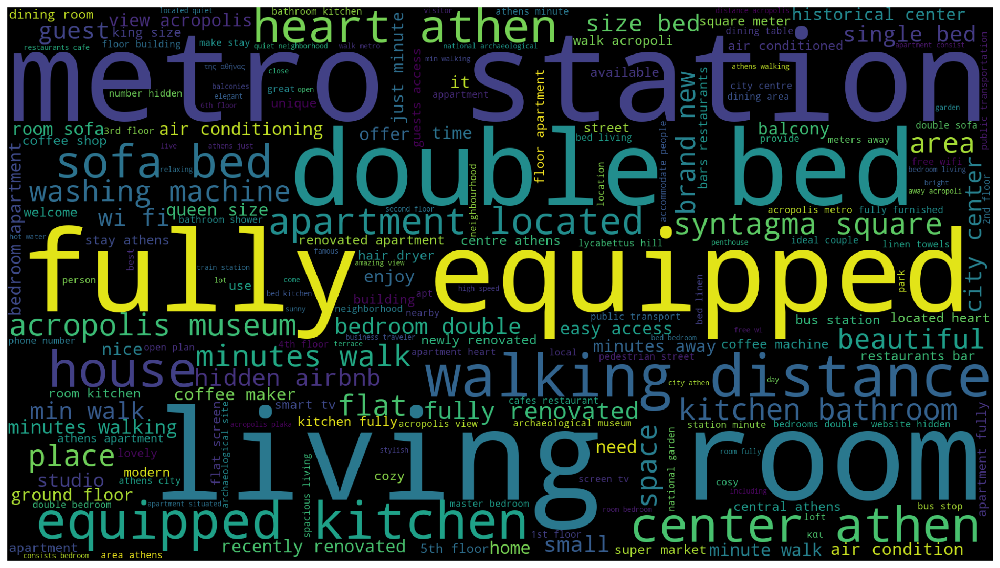

In [69]:
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS as stops

description = rec_df['description']
wordcloud3 = WordCloud(width=1920, height=1080, background_color='black',stopwords=stops).generate(' '.join(description))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud3)
plt.axis("off")
plt.show()

## 3.1

We convert the *name* column to lower case and merge *name* and *description* columns, replacing the NaN values with null string.

In [70]:
rec_df['name'] = rec_df['name'].str.lower()

rec_df['summary'] = rec_df['name']+rec_df['description']

Construct the TF-IDF array for the *summary* column.

In [71]:
from sklearn.metrics.pairwise import cosine_similarity

summary = rec_df['summary']
vectorizer = TfidfVectorizer(ngram_range=(1,2), stop_words=stops)

X = vectorizer.fit_transform(summary)

## 3.2

We calculate the cosine similarity from table X.

In [72]:
cos_sim = cosine_similarity(X)

We take the top triangular part of the cosine similarity table because we only want the pairs once (if we took the whole one it would return them twice at the end in reverse order.

In [74]:
cos_sim1 = np.triu(cos_sim, k = 1)

Then we get the 100 highest scores of cosine similarity, ie the most similar listings.

In [76]:
idx = np.argsort(cos_sim1.ravel())[-100:][::-1]
similar = np.c_[np.unravel_index(idx, cos_sim1.shape)]

Finally, we make a dictionary with the listings' IDs as keys, and the most similar listings' IDs.

In [77]:
similar_estates = {}
for i,j in similar:
    id1 = rec_df.loc[[i]].id.values[0]
    id2 = rec_df.loc[[j]].id.values[0]
    similar_estates[id1] = id2

In [78]:
print("ID1:       ID2")
similar_estates

ID1:       ID2


{25207595: 25207888,
 25711811: 30723595,
 10603975: 27162716,
 14865006: 24171480,
 26497308: 30424563,
 31560654: 31561260,
 31558982: 31561260,
 32649434: 32650553,
 32650034: 32650553,
 27254673: 30009754,
 30314684: 30314687,
 18624578: 29174806,
 30314683: 30314687,
 29945264: 30373912,
 30341020: 30980510,
 30089884: 30760835,
 30363015: 30906405,
 30362269: 30363015,
 25941499: 26092250,
 30906405: 30980510,
 30760835: 30980510,
 30980429: 30980510,
 29926293: 29945264,
 29925898: 29926293,
 1223199: 29057234,
 30363275: 30373912,
 30373912: 30578520,
 31509474: 31509785,
 9648099: 9648354,
 31560802: 31561260,
 32650458: 32650553,
 24425858: 31461934,
 4440310: 32921918,
 23225556: 23225775,
 22669275: 22714490,
 11366771: 11402677,
 22158542: 23496844,
 31560982: 31561260,
 16473889: 16551779,
 11542772: 11559962,
 11559962: 11562618,
 31450371: 31509474,
 23664459: 26273246,
 17216563: 17216641,
 8365419: 18652795,
 8326092: 13486998,
 25515948: 26118125,
 26118125: 26118850

## 3.3

In the following function we export from the table with the similarity scores, pairs of indices in the *rec_df* dataframe and the similarity scores. Then, we place them on a list and sort them. We take the N first elements with the highest similarity score and search the dataframe based on the index, to retrieve the information from the columns. Finally, we print them.

In [81]:
from heapq import nlargest

def recommend(item_id, num):
    """ Retrieve item_id's index in the dataframe, if it exists. """
    row = rec_df.index[rec_df['id'] == item_id]
    if row.size==0:
        print("Listing id doesn't exist.")
        return None
    """ Get the index of the row. """
    id_index = row.tolist()[0]
    """ Get the similarity scores with every other listing."""
    similarity_scores = cos_sim[id_index].tolist()
    """ Save their indices from the dataframe. """
    similar_indices = [idx for idx in range(len(similarity_scores))]
    
    """ Zip those two lists above into a tuple, sort it and get the num most similar. Shift one position, to skip itself. """
    similar_estates = list(zip(similar_indices, similarity_scores))
    sorted_similar_estates = sorted(similar_estates, key = lambda x: float(x[1]), reverse = True)[1:num+1]

    """ Print the results. """
    print("Recommending",num,"listings similar to Studio")
    print("-----------------------------------------")
    for item in sorted_similar_estates:
        similar_item = rec_df.loc[item[0]]
        print("Recommended:",similar_item['name'])
        print("Description:",similar_item['description'])
        print("score:",item[1],"\n\n")
        

In [82]:
recommend(27254673,5)

Recommending 5 listings similar to Studio
-----------------------------------------
Recommended: the neoclassic, 100sqm of comfort in athens center
Description: the neoclassic is a fully renovated and equipped apartment that promises its visitors the ultimate comfort. it is located in the neapoli district, one minute away from the alexandras avenue. the neoclassic is an extremely bright apartment on the 4th floor of a very quiet building with a beautiful view of mt lycabettus and the argentinis dimokratias square and it is only 10 minutes (on foot) away from the ambelokipi metro and 7 minutes (on foot) away from the archaeological museum of athens. we remain at your service to ensure your holidays and stay at the neoclassic are unforgettable. we will provide you with a tourist guide for all your needs while in athens (moving around, places to visit, places to eat etc). we have also prepared for you a pdf file with all the emergency information you may need, as well as information about

## 3.4

We convert the values of the *summar* column to a single string, and its tokenizzing is undertaken by the word_tokenize function of the *nltk* library. Then we use the *BigramCollocationFinder* function and find ten listings that tend to appear more often together.

In [80]:
import nltk
from nltk.collocations import BigramCollocationFinder
from nltk.tokenize import word_tokenize
import re

bigram_measures = nltk.collocations.BigramAssocMeasures()

mystr = rec_df['summary'].to_string()
finder = BigramCollocationFinder.from_words(word_tokenize(mystr))
finder.nbest(bigram_measures.pmi, 10)

[('***7', 'stars***'),
 ('*a+central', 'athens*low'),
 ('*di', 'giorgio'),
 ('*please', 'make'),
 ('--', 'now'),
 ('-athensluxury', 'bouti'),
 ('-best', 'area-athens_next'),
 ('-huge', 'balcony-room'),
 ('-spacious', '105m2-'),
 ('/airport', 'linecozy')]